In [1]:
!pip install -q ultralytics
!pip install -q roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.4/887.4 kB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.2 MB/s eta 0:00:00


In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="")
project = rf.workspace("carsight").project("car-odometer")
version = project.version(3)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Car-Odometer-3 in yolov8:: 100%|██████████| 2586/2586 [00:00<00:00, 5249.50it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
from ultralytics import YOLO
import yaml
import os
import shutil
from sklearn.model_selection import train_test_split

In [4]:
base_dir = '/content/Car-Odometer-3'
images_dir = os.path.join(base_dir, "train/images")
labels_dir = os.path.join(base_dir, "train/labels")
new_base_dir = os.path.join('', "odo_dataset")

# Create the new directory structure
new_train_images_dir = os.path.join(new_base_dir, "train/images")
new_train_labels_dir = os.path.join(new_base_dir, "train/labels")
new_val_images_dir = os.path.join(new_base_dir, "valid/images")
new_val_labels_dir = os.path.join(new_base_dir, "valid/labels")
new_test_images_dir = os.path.join(new_base_dir, "test/images")
new_test_labels_dir = os.path.join(new_base_dir, "test/labels")

for path in [new_train_images_dir, new_train_labels_dir, new_val_images_dir, new_val_labels_dir, new_test_images_dir, new_test_labels_dir]:
    os.makedirs(path, exist_ok=True)

# Get all image and label files
image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg') or f.endswith('.png')]
label_files = [f.replace('.jpg', '.txt').replace('.png', '.txt') for f in image_files]

# Split into train, validation, and test sets (e.g., 70% train, 15% val, 15% test)
train_images, test_images, train_labels, test_labels = train_test_split(image_files, label_files, test_size=0.3, random_state=42)
val_images, test_images, val_labels, test_labels = train_test_split(test_images, test_labels, test_size=0.5, random_state=42)

# Function to copy files to the respective folders
def copy_files(file_list, src_dir, dest_dir):
    for file_name in file_list:
        src_path = os.path.join(src_dir, file_name)
        dest_path = os.path.join(dest_dir, file_name)
        if os.path.exists(src_path):
            shutil.copy(src_path, dest_path)

# Copy files for train set
copy_files(train_images, images_dir, new_train_images_dir)
copy_files(train_labels, labels_dir, new_train_labels_dir)

# Copy files for validation set
copy_files(val_images, images_dir, new_val_images_dir)
copy_files(val_labels, labels_dir, new_val_labels_dir)

# Copy files for test set
copy_files(test_images, images_dir, new_test_images_dir)
copy_files(test_labels, labels_dir, new_test_labels_dir)

print("Dataset split successfully.")

Dataset split successfully.


In [5]:
yaml_path = '/content/Car-Odometer-3/data.yaml'
new_paths = {
    'train': '/content/odo_dataset/train/images',
    'val': '/content/odo_dataset/valid/images',
    'test': '/content/odo_dataset/test/images'
}

with open(yaml_path, 'r') as file:
    data = yaml.safe_load(file)
data.update(new_paths)
with open(yaml_path, 'w') as file:
    yaml.dump(data, file)

print("Paths updated successfully.")

Paths updated successfully.


In [6]:
model = YOLO('yolov8s.yaml')

In [7]:
result = model.train(
    data='/content/Car-Odometer-3/data.yaml',       # Path to YAML file
    epochs=100,                                     # Number of epochs
    batch=16,                                       # batch size
    imgsz=640,                                      # Image size
    device=0,                                       # Specify GPUs
    name='CarSight-Odo',                            # Experiment name
    patience=5
)

Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/Car-Odometer-3/data.yaml, epochs=100, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=CarSight-Odo, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True

100%|██████████| 755k/755k [00:00<00:00, 21.6MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 93.2MB/s]


AMP: checks passed ✅


train: Scanning /content/odo_dataset/train/labels... 903 images, 0 backgrounds, 0 corrupt: 100%|██████████| 903/903 [00:00<00:00, 1907.26it/s]

train: New cache created: /content/odo_dataset/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/odo_dataset/valid/labels... 193 images, 0 backgrounds, 0 corrupt: 100%|██████████| 193/193 [00:00<00:00, 1560.80it/s]

val: New cache created: /content/odo_dataset/valid/labels.cache


Plotting labels to runs/detect/CarSight-Odo/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/CarSight-Odo
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      4.06G      3.978      5.048      4.093         11        640: 100%|██████████| 57/57 [00:21<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.39it/s]


                   all        193        193   0.000232     0.0674   0.000132      4e-05

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.01G      3.184      3.725      3.324         16        640: 100%|██████████| 57/57 [00:23<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.33it/s]

                   all        193        193     0.0603     0.0933     0.0141    0.00402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.87G      2.818      3.289        2.9         12        640: 100%|██████████| 57/57 [00:27<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.46it/s]

                   all        193        193      0.092     0.0777     0.0297    0.00801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.89G       2.68      2.891      2.719         18        640: 100%|██████████| 57/57 [00:27<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.26it/s]

                   all        193        193      0.191      0.212      0.109     0.0315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.05G      2.481      2.634      2.572         15        640: 100%|██████████| 57/57 [00:20<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.87it/s]

                   all        193        193      0.209      0.399      0.203     0.0776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.05G      2.369       2.46      2.488         13        640: 100%|██████████| 57/57 [00:18<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.57it/s]

                   all        193        193       0.19      0.109     0.0686     0.0233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         4G      2.337      2.374      2.426          8        640: 100%|██████████| 57/57 [00:18<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.43it/s]

                   all        193        193      0.351       0.15      0.119      0.035



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      3.89G      2.201      2.238       2.32         12        640: 100%|██████████| 57/57 [00:19<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.41it/s]

                   all        193        193      0.367      0.347      0.293      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.03G      2.182      2.122      2.261          9        640: 100%|██████████| 57/57 [00:18<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.31it/s]

                   all        193        193      0.392      0.477      0.412      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      3.87G      2.078      1.998      2.171         11        640: 100%|██████████| 57/57 [00:19<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]

                   all        193        193      0.515      0.409      0.393       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         4G      2.009      1.908      2.113          8        640: 100%|██████████| 57/57 [00:18<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.32it/s]

                   all        193        193      0.561      0.516      0.505      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      4.04G      1.999      1.863      2.079          8        640: 100%|██████████| 57/57 [00:19<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.34it/s]

                   all        193        193      0.555      0.562       0.59      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.03G          2      1.824      2.116         12        640: 100%|██████████| 57/57 [00:19<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.81it/s]

                   all        193        193      0.546      0.585      0.563      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.05G       1.95      1.798      2.032         14        640: 100%|██████████| 57/57 [00:18<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.33it/s]

                   all        193        193       0.69      0.622      0.668      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         4G      1.884      1.745      2.023         17        640: 100%|██████████| 57/57 [00:19<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.17it/s]

                   all        193        193      0.634      0.682      0.664      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.89G      1.846      1.722       1.98         13        640: 100%|██████████| 57/57 [00:19<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.45it/s]

                   all        193        193      0.696      0.611      0.706       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      4.04G      1.839      1.566      1.988         15        640: 100%|██████████| 57/57 [00:19<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.35it/s]

                   all        193        193      0.719      0.678      0.727      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.03G      1.846      1.604      1.935          9        640: 100%|██████████| 57/57 [00:19<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:03<00:00,  2.24it/s]

                   all        193        193        0.8      0.689      0.784      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.99G      1.812      1.552      1.922         17        640: 100%|██████████| 57/57 [00:19<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.47it/s]

                   all        193        193       0.81       0.56       0.68      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.89G      1.803       1.56      1.914          9        640: 100%|██████████| 57/57 [00:21<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.38it/s]

                   all        193        193      0.698      0.586      0.628      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.03G      1.746      1.509       1.89         12        640: 100%|██████████| 57/57 [00:18<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.62it/s]

                   all        193        193      0.734      0.727      0.762      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      4.04G      1.731      1.489      1.862         14        640: 100%|██████████| 57/57 [00:18<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.55it/s]

                   all        193        193      0.688      0.668      0.703      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         4G       1.73      1.476      1.863         10        640: 100%|██████████| 57/57 [00:18<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.54it/s]

                   all        193        193      0.693      0.715      0.747      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.89G      1.759      1.498      1.891         15        640: 100%|██████████| 57/57 [00:19<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.35it/s]

                   all        193        193      0.827      0.769      0.827      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      4.03G      1.727      1.423      1.851         13        640: 100%|██████████| 57/57 [00:19<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.55it/s]

                   all        193        193      0.803      0.772      0.834      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.03G      1.715      1.406      1.832         16        640: 100%|██████████| 57/57 [00:18<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.38it/s]

                   all        193        193      0.754      0.714      0.782      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         4G      1.726      1.422      1.834         16        640: 100%|██████████| 57/57 [00:18<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]

                   all        193        193      0.835      0.741      0.843      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.06G      1.648      1.342       1.78         13        640: 100%|██████████| 57/57 [00:18<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.52it/s]

                   all        193        193      0.852      0.747      0.846      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      4.03G      1.679      1.353      1.821         16        640: 100%|██████████| 57/57 [00:19<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.46it/s]

                   all        193        193       0.84      0.705      0.791      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      4.03G      1.658      1.309      1.803         13        640: 100%|██████████| 57/57 [00:18<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.68it/s]

                   all        193        193      0.834      0.805      0.874      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.84G       1.66      1.347      1.783         10        640: 100%|██████████| 57/57 [00:18<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.86it/s]

                   all        193        193      0.857      0.777      0.849      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.89G       1.63      1.299      1.756         17        640: 100%|██████████| 57/57 [00:18<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.40it/s]

                   all        193        193      0.828      0.823      0.888      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.87G      1.604       1.26      1.731         12        640: 100%|██████████| 57/57 [00:19<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.58it/s]

                   all        193        193      0.805      0.767      0.821      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.87G      1.631      1.242      1.743          7        640: 100%|██████████| 57/57 [00:19<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.69it/s]

                   all        193        193      0.823      0.829      0.872       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         4G      1.591      1.218      1.705         13        640: 100%|██████████| 57/57 [00:18<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.36it/s]

                   all        193        193      0.884      0.788      0.877      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      4.04G       1.58       1.17      1.692         18        640: 100%|██████████| 57/57 [00:22<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.35it/s]

                   all        193        193        0.9       0.84      0.903       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      4.03G       1.55      1.143      1.669         12        640: 100%|██████████| 57/57 [00:18<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.67it/s]

                   all        193        193      0.869      0.813      0.889      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      4.03G      1.579      1.199      1.709          8        640: 100%|██████████| 57/57 [00:18<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.76it/s]

                   all        193        193      0.873      0.786      0.883      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         4G      1.545       1.12      1.695         17        640: 100%|██████████| 57/57 [00:19<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]

                   all        193        193      0.789      0.852      0.879      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      3.89G      1.556      1.104      1.679         14        640: 100%|██████████| 57/57 [00:18<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.92it/s]

                   all        193        193      0.857      0.876      0.911      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      4.03G      1.555      1.098      1.662          8        640: 100%|██████████| 57/57 [00:18<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.53it/s]

                   all        193        193      0.834      0.855      0.906      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      4.03G      1.529      1.096      1.676          6        640: 100%|██████████| 57/57 [00:18<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.62it/s]

                   all        193        193      0.829      0.879      0.901      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         4G        1.5      1.091      1.655         15        640: 100%|██████████| 57/57 [00:18<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.22it/s]

                   all        193        193      0.905      0.855      0.921      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.89G      1.512      1.098      1.664         11        640: 100%|██████████| 57/57 [00:18<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.38it/s]

                   all        193        193      0.876      0.913      0.936      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.88G      1.488      1.033      1.624         17        640: 100%|██████████| 57/57 [00:18<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.30it/s]

                   all        193        193      0.897      0.876      0.927      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      4.02G      1.488      1.053      1.647          9        640: 100%|██████████| 57/57 [00:18<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.65it/s]

                   all        193        193      0.924      0.886      0.944      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         4G      1.519      1.029      1.641         17        640: 100%|██████████| 57/57 [00:18<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.57it/s]

                   all        193        193      0.876      0.916      0.927      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      3.89G      1.454      1.044      1.637         12        640: 100%|██████████| 57/57 [00:18<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.92it/s]

                   all        193        193      0.921      0.903      0.937       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      4.03G       1.49      1.041      1.627         14        640: 100%|██████████| 57/57 [00:18<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  3.01it/s]

                   all        193        193      0.884      0.902      0.933       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.03G      1.479      1.014      1.612         13        640: 100%|██████████| 57/57 [00:18<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.74it/s]

                   all        193        193      0.901      0.855      0.919      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.84G      1.474      1.029      1.638         13        640: 100%|██████████| 57/57 [00:19<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.69it/s]

                   all        193        193      0.899      0.891      0.935      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.05G      1.448     0.9913      1.593         14        640: 100%|██████████| 57/57 [00:20<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.79it/s]

                   all        193        193      0.901      0.912       0.93      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      4.03G      1.451      0.995      1.596         14        640: 100%|██████████| 57/57 [00:18<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.36it/s]

                   all        193        193      0.886       0.87      0.922      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.03G      1.449     0.9777      1.587         10        640: 100%|██████████| 57/57 [00:18<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.47it/s]

                   all        193        193      0.891      0.943      0.942      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.84G       1.42     0.9656      1.566         11        640: 100%|██████████| 57/57 [00:18<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.45it/s]

                   all        193        193      0.928      0.886       0.95      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.89G      1.435     0.9536      1.566         13        640: 100%|██████████| 57/57 [00:18<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.55it/s]

                   all        193        193      0.889      0.911      0.942      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.87G      1.434     0.9581      1.605          8        640: 100%|██████████| 57/57 [00:18<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.83it/s]

                   all        193        193      0.922      0.902      0.951      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.03G      1.443     0.9546      1.585         13        640: 100%|██████████| 57/57 [00:18<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.40it/s]

                   all        193        193      0.934      0.907      0.948      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.01G      1.414     0.9338      1.584         14        640: 100%|██████████| 57/57 [00:18<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.65it/s]

                   all        193        193      0.907      0.902      0.943      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.89G      1.403     0.9378      1.562         16        640: 100%|██████████| 57/57 [00:18<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.51it/s]

                   all        193        193      0.946      0.905       0.95      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.03G      1.375     0.8837      1.543         12        640: 100%|██████████| 57/57 [00:18<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]

                   all        193        193      0.939      0.907      0.953      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.87G      1.381     0.9096      1.533          9        640: 100%|██████████| 57/57 [00:18<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.19it/s]

                   all        193        193      0.926      0.886      0.941      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.84G      1.414     0.9001      1.542         11        640: 100%|██████████| 57/57 [00:18<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  4.53it/s]

                   all        193        193      0.883      0.899      0.928      0.547
EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 58, best model saved as best.pt.
To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



63 epochs completed in 0.395 hours.
Optimizer stripped from runs/detect/CarSight-Odo/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/CarSight-Odo/weights/best.pt, 22.5MB

Validating runs/detect/CarSight-Odo/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.35 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:02<00:00,  2.51it/s]


                   all        193        193      0.934      0.907      0.948      0.579
Speed: 0.2ms preprocess, 4.0ms inference, 0.0ms loss, 3.5ms postprocess per image
Results saved to runs/detect/CarSight-Odo



image 1/1 /content/odo_dataset/test/images/image_131_webp.rf.0dfdeab2776bd6390e73e0f8b74c910f.jpg: 480x640 1 roi, 43.6ms
Speed: 2.1ms preprocess, 43.6ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict
1 label saved to /content/predictions/predict/labels


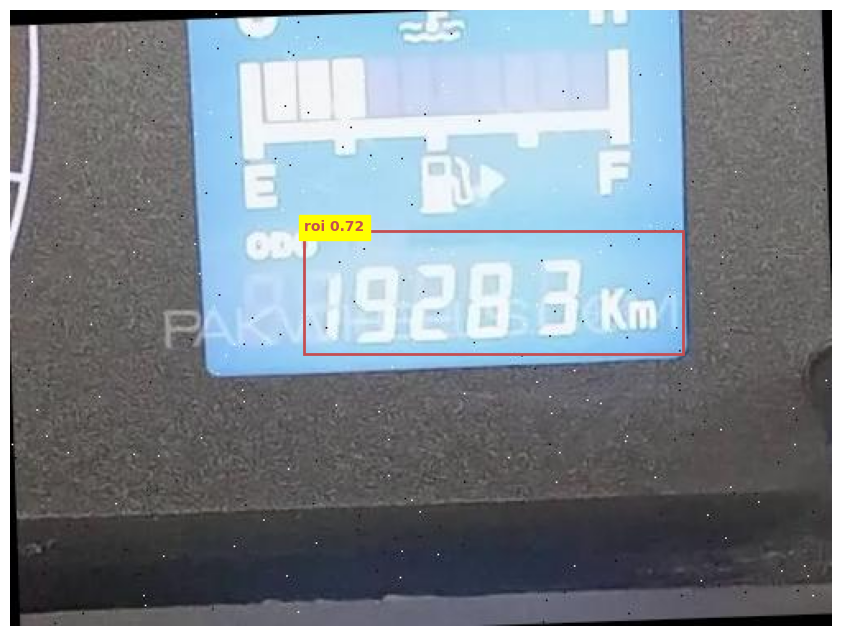


image 1/1 /content/odo_dataset/test/images/image_190_webp.rf.523c49c17850a31edf9b5efe3ab88f41.jpg: 480x640 1 roi, 13.7ms
Speed: 6.7ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict2
1 label saved to /content/predictions/predict2/labels


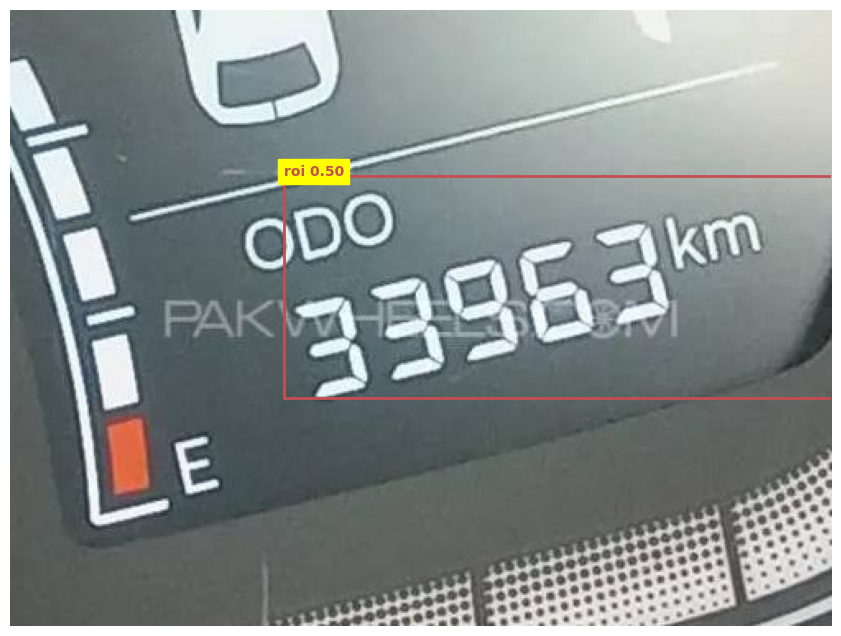


image 1/1 /content/odo_dataset/test/images/image_5_webp.rf.f59ed22fac83ce73636b147df26d75d9.jpg: 288x640 1 roi, 64.3ms
Speed: 2.2ms preprocess, 64.3ms inference, 1.7ms postprocess per image at shape (1, 3, 288, 640)
Results saved to /content/predictions/predict3
1 label saved to /content/predictions/predict3/labels


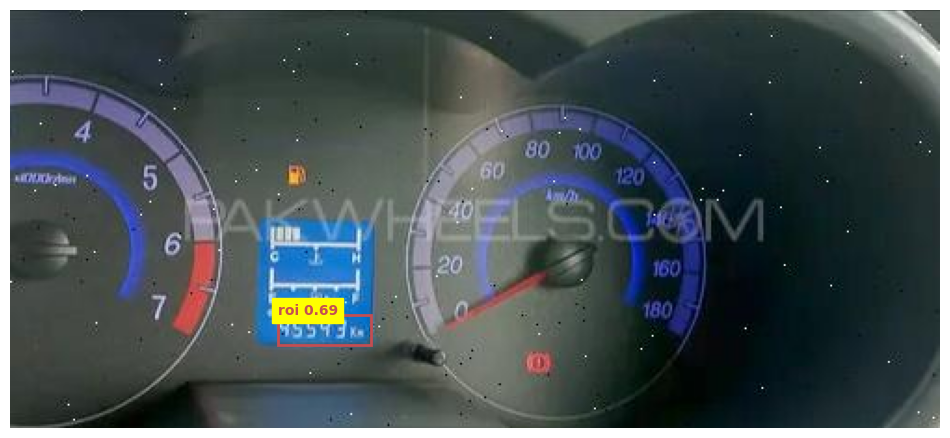


image 1/1 /content/odo_dataset/test/images/image_241-2-_webp.rf.d170fee49236a98315bfe600b5101f46.jpg: 384x640 2 rois, 69.0ms
Speed: 2.5ms preprocess, 69.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/predictions/predict4
1 label saved to /content/predictions/predict4/labels


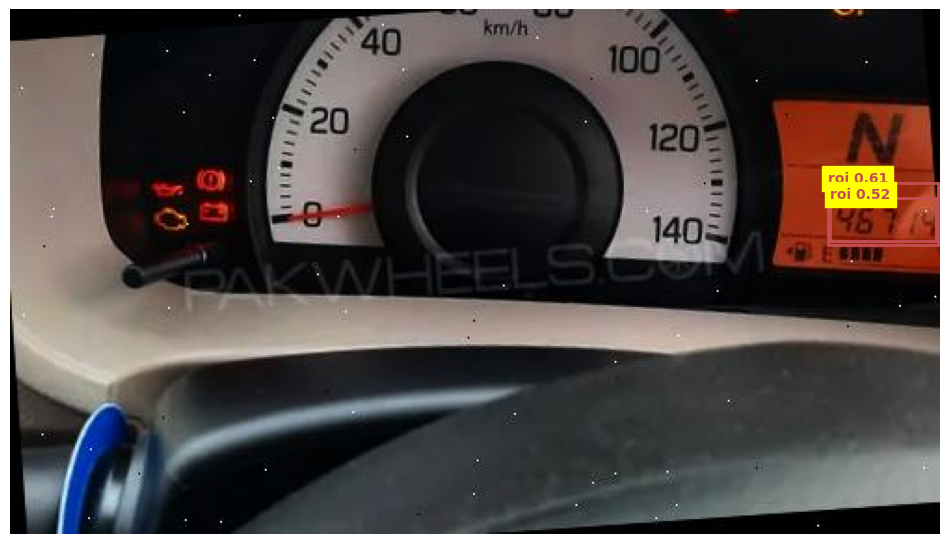


image 1/1 /content/odo_dataset/test/images/image_21-2-_webp.rf.ae0673569c1c77b73e9878c54cfe2d43.jpg: 480x640 1 roi, 14.4ms
Speed: 3.2ms preprocess, 14.4ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict5
1 label saved to /content/predictions/predict5/labels


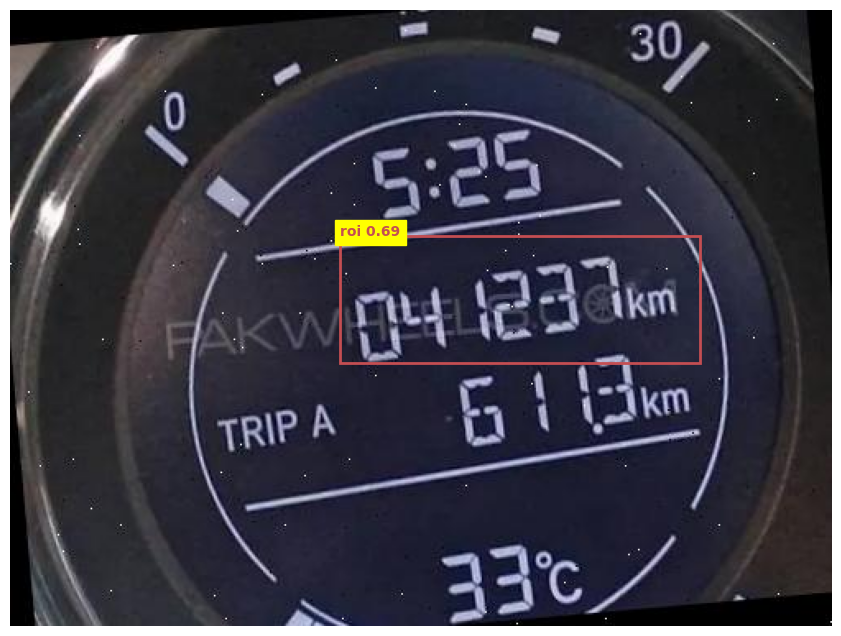


image 1/1 /content/odo_dataset/test/images/image_12_webp.rf.bfc1ee22c11b6dc9bac85b6d9b93314d.jpg: 480x640 1 roi, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict6
1 label saved to /content/predictions/predict6/labels


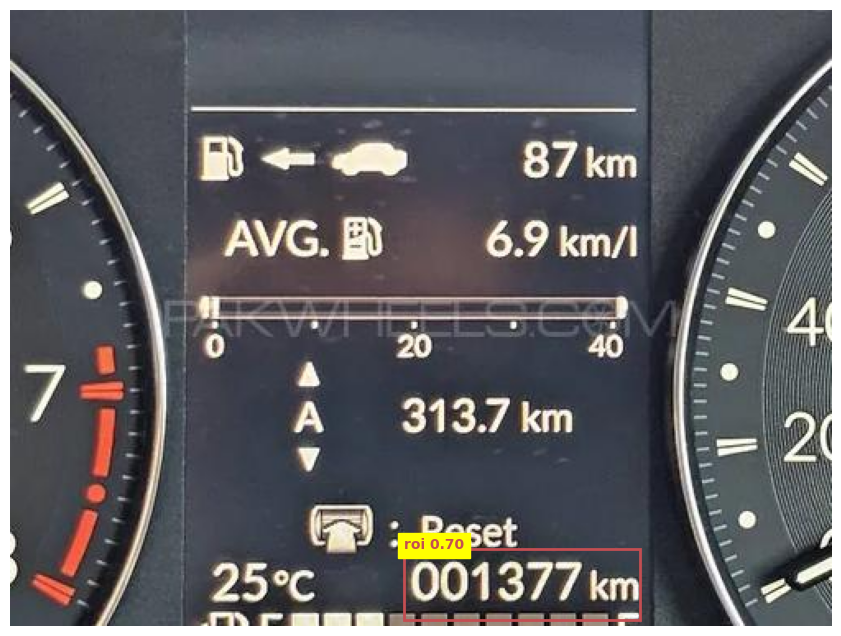


image 1/1 /content/odo_dataset/test/images/image_29-2-_webp.rf.cd82080ee64822dc1a90f947f0047fbf.jpg: 512x640 1 roi, 67.7ms
Speed: 3.1ms preprocess, 67.7ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)
Results saved to /content/predictions/predict7
1 label saved to /content/predictions/predict7/labels


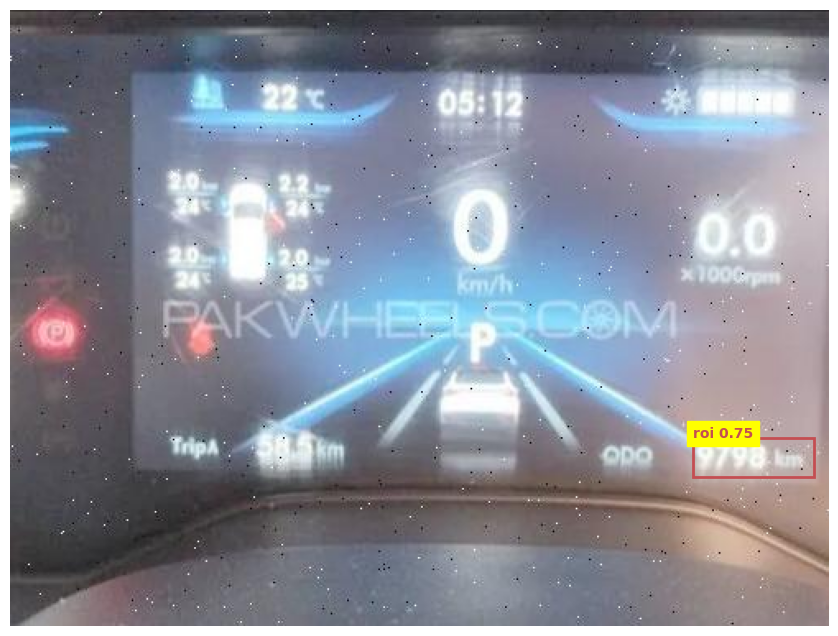


image 1/1 /content/odo_dataset/test/images/image_241_webp.rf.3d90cad7cb0eac7ef770daa1181110be.jpg: 480x640 1 roi, 14.4ms
Speed: 3.0ms preprocess, 14.4ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict8
1 label saved to /content/predictions/predict8/labels


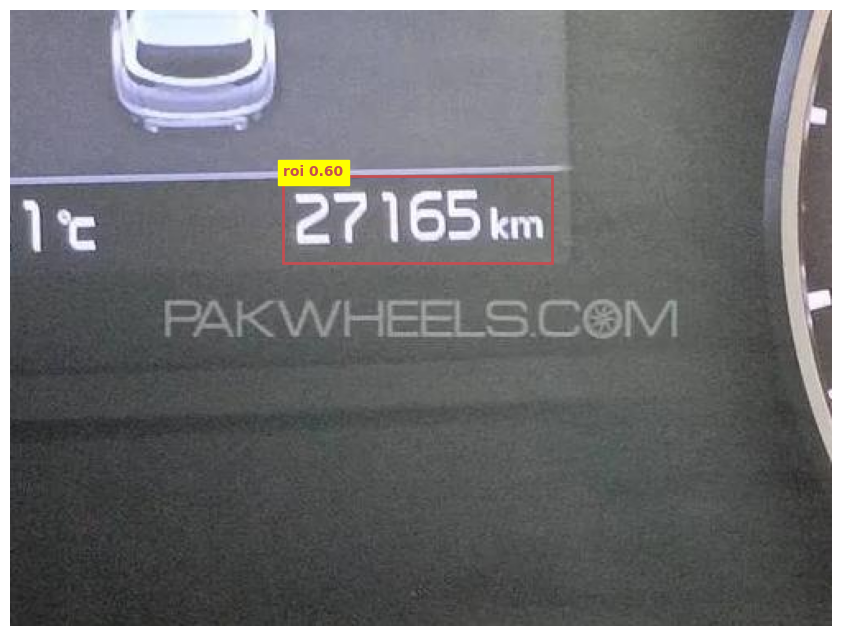


image 1/1 /content/odo_dataset/test/images/image_261_webp.rf.87fffbb5dd294edd16ea3b56ea047881.jpg: 480x640 1 roi, 19.1ms
Speed: 3.3ms preprocess, 19.1ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict9
1 label saved to /content/predictions/predict9/labels


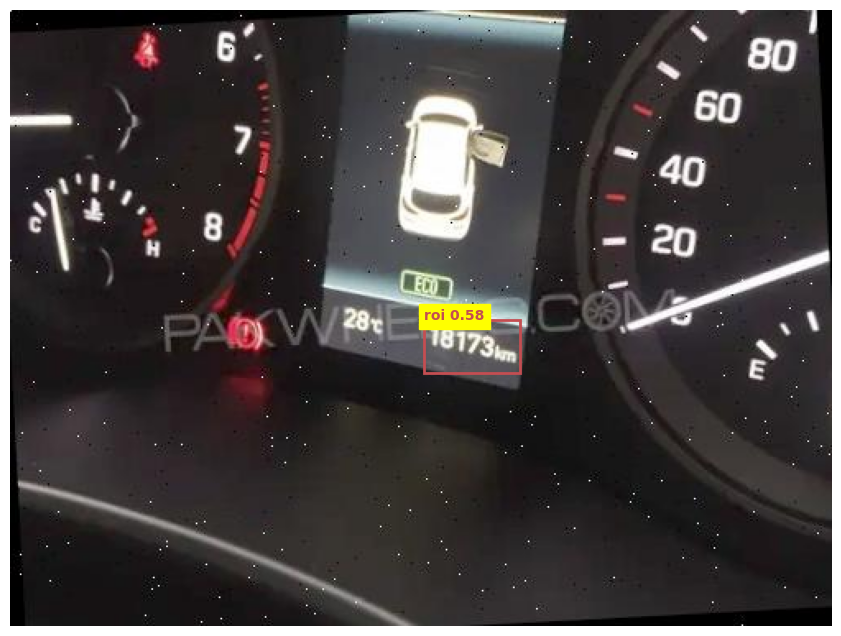


image 1/1 /content/odo_dataset/test/images/image_38_webp.rf.a9e2870deb2be361b98cb9a8affdd4d9.jpg: 480x640 1 roi, 13.3ms
Speed: 3.1ms preprocess, 13.3ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict10
1 label saved to /content/predictions/predict10/labels


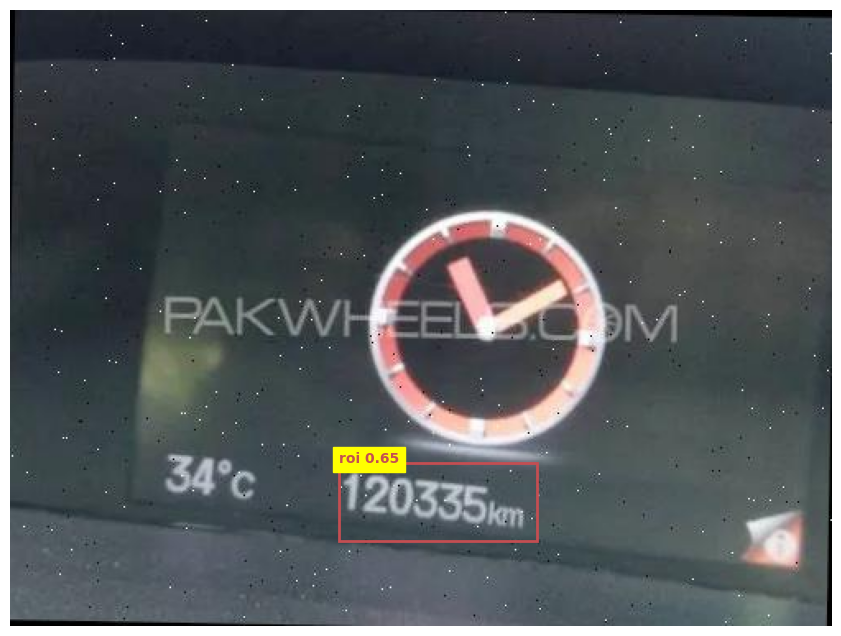


image 1/1 /content/odo_dataset/test/images/image_11-3-_webp.rf.86dab0a5d157402653bc0a8409ce3519.jpg: 480x640 1 roi, 13.5ms
Speed: 3.1ms preprocess, 13.5ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict11
1 label saved to /content/predictions/predict11/labels


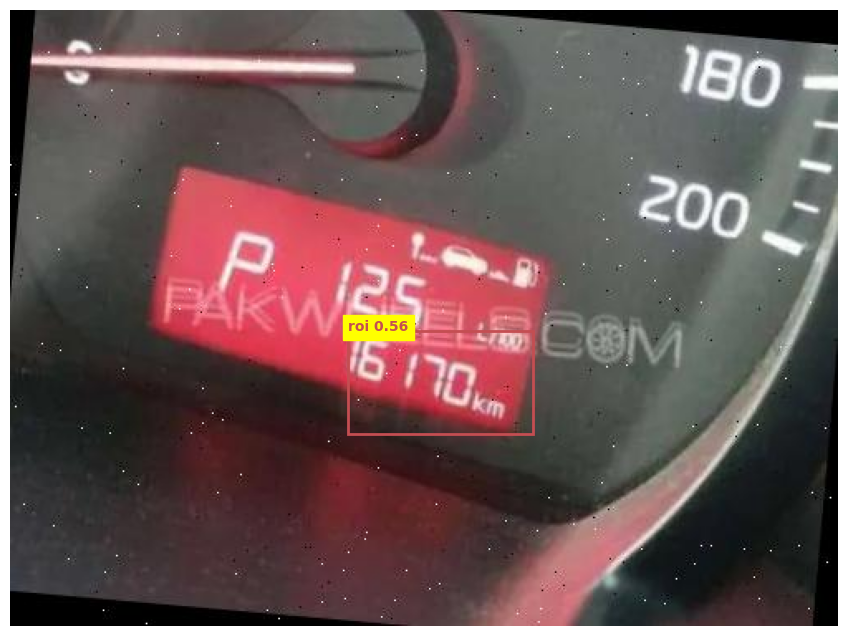


image 1/1 /content/odo_dataset/test/images/image_3-2-_webp.rf.c8ad76f0366340ba250cb749771ae25d.jpg: 512x640 1 roi, 19.8ms
Speed: 3.0ms preprocess, 19.8ms inference, 3.5ms postprocess per image at shape (1, 3, 512, 640)
Results saved to /content/predictions/predict12
1 label saved to /content/predictions/predict12/labels


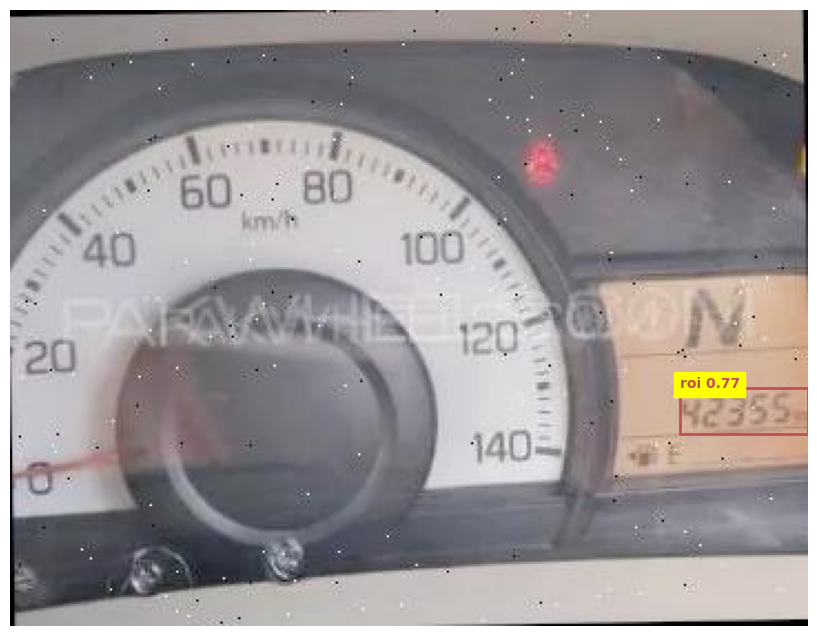


image 1/1 /content/odo_dataset/test/images/image_4_webp.rf.b79c2f5e096017fbc6fb5c01f725148e.jpg: 480x640 1 roi, 19.9ms
Speed: 3.2ms preprocess, 19.9ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict13
1 label saved to /content/predictions/predict13/labels


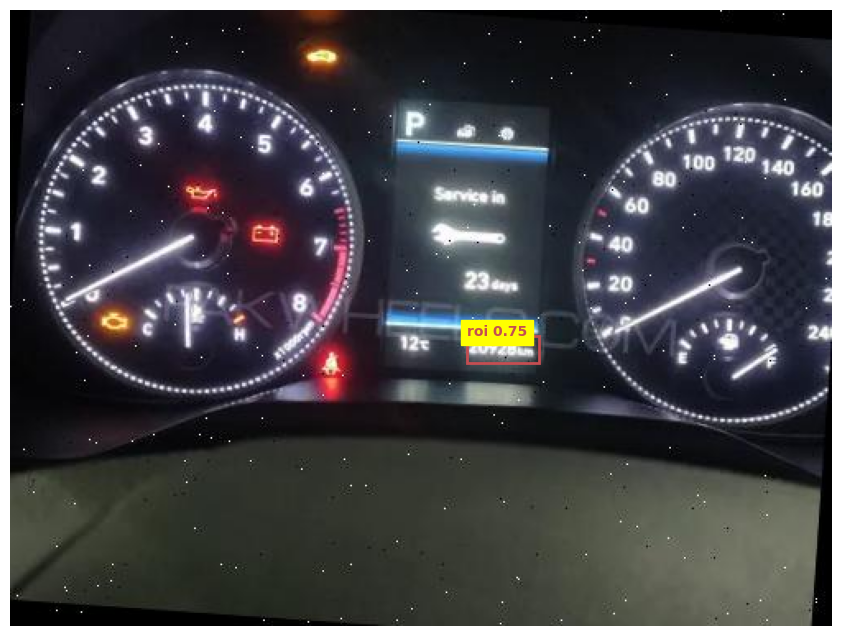


image 1/1 /content/odo_dataset/test/images/image_11-4-_webp.rf.baa4d1e6d5b36c690ba82d6bbaba09fc.jpg: 480x640 1 roi, 13.3ms
Speed: 3.0ms preprocess, 13.3ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict14
1 label saved to /content/predictions/predict14/labels


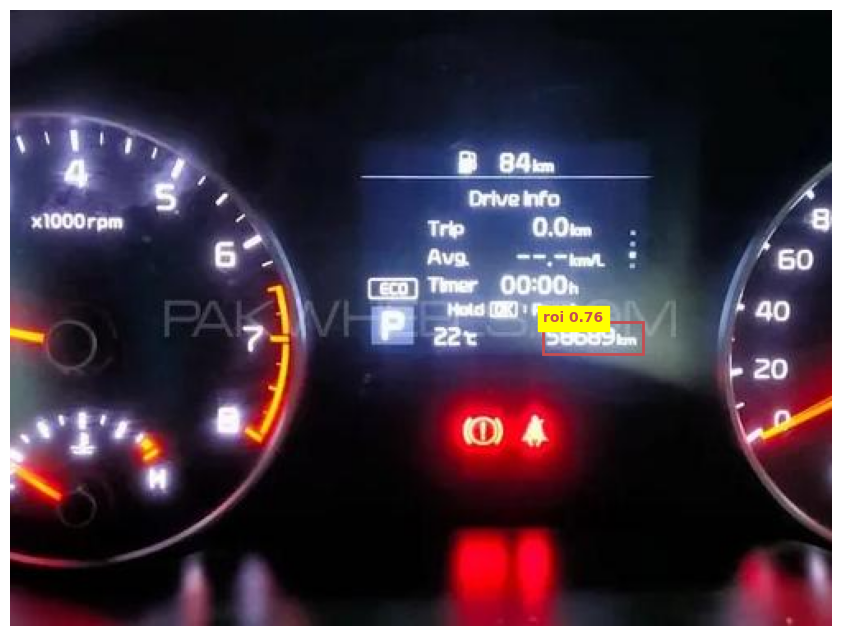


image 1/1 /content/odo_dataset/test/images/image_74-2-_webp.rf.3207a28aaa7eb11d684cca06d7fa4fa4.jpg: 480x640 1 roi, 15.3ms
Speed: 4.2ms preprocess, 15.3ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict15
1 label saved to /content/predictions/predict15/labels


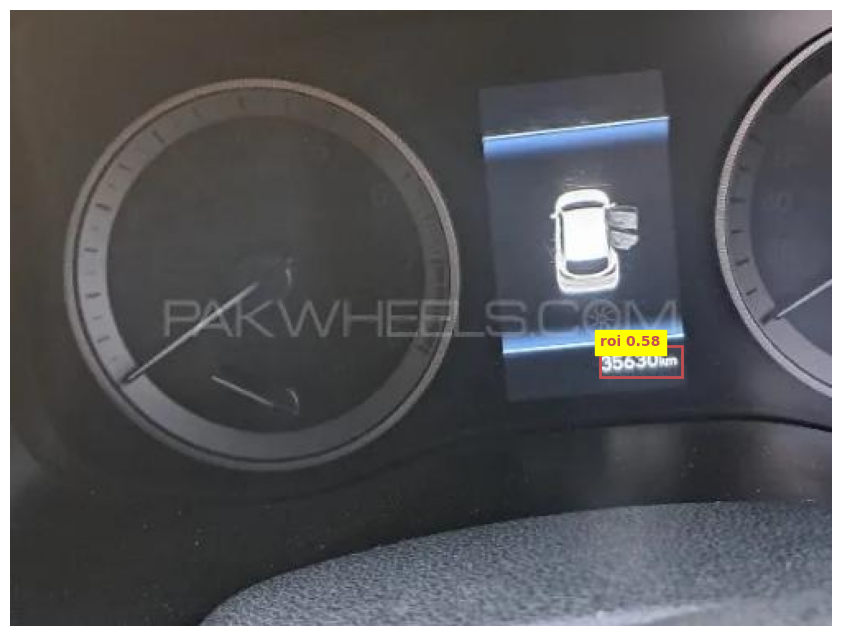


image 1/1 /content/odo_dataset/test/images/image_25_webp.rf.6819a64c84e06abf33e1ded044936509.jpg: 512x640 1 roi, 17.2ms
Speed: 3.1ms preprocess, 17.2ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)
Results saved to /content/predictions/predict16
1 label saved to /content/predictions/predict16/labels


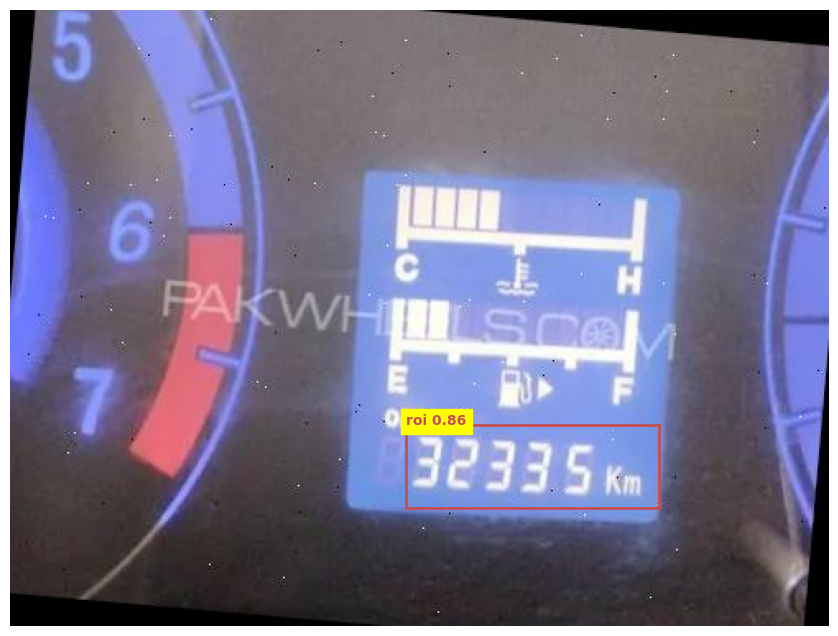


image 1/1 /content/odo_dataset/test/images/image_123_webp.rf.3177341e4c78da369517308c4f2affe3.jpg: 480x640 1 roi, 14.4ms
Speed: 2.9ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict17
1 label saved to /content/predictions/predict17/labels


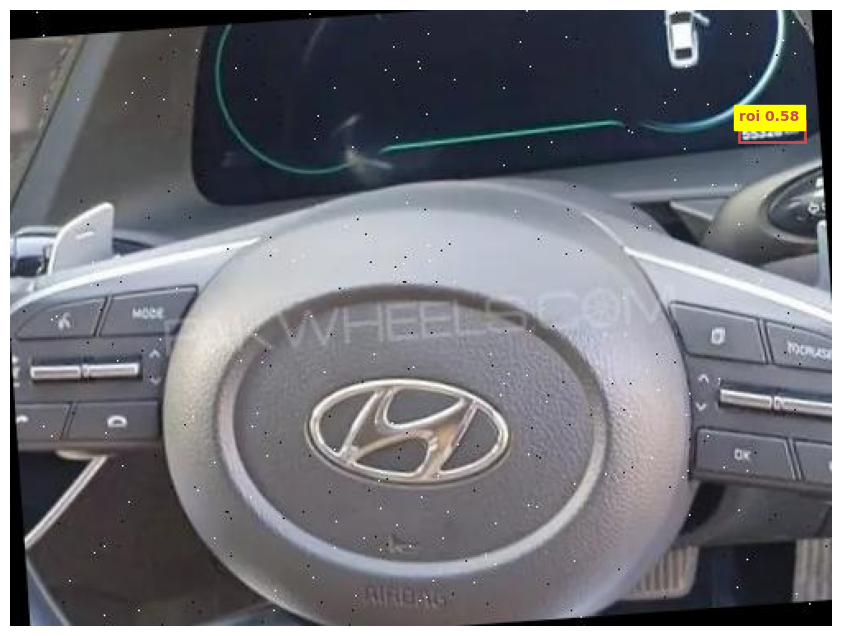


image 1/1 /content/odo_dataset/test/images/image_41_webp.rf.5451538d26524033c9f333250b1a5d58.jpg: 640x512 1 roi, 74.4ms
Speed: 5.0ms preprocess, 74.4ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 512)
Results saved to /content/predictions/predict18
1 label saved to /content/predictions/predict18/labels


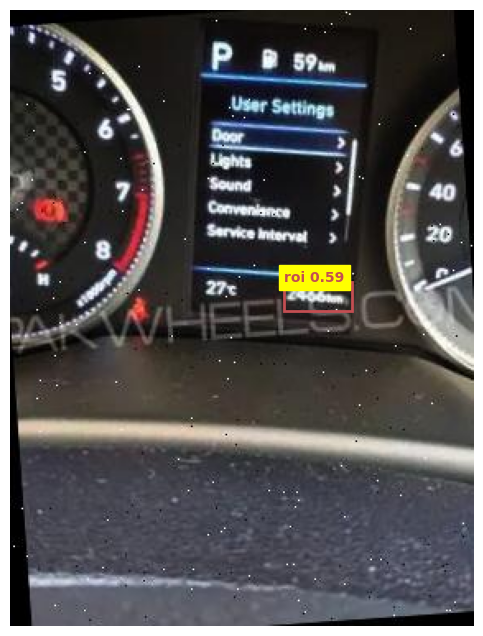


image 1/1 /content/odo_dataset/test/images/image_19-4-_webp.rf.65ccc37a6b002636ddf0f0870e6e99d1.jpg: 640x512 2 rois, 14.6ms
Speed: 2.9ms preprocess, 14.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 512)
Results saved to /content/predictions/predict19
1 label saved to /content/predictions/predict19/labels


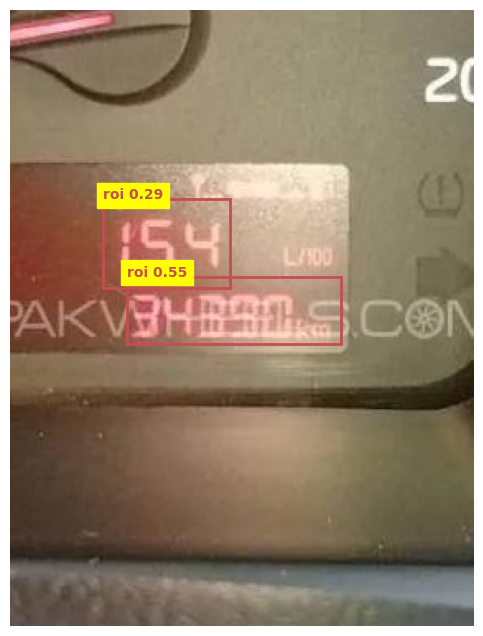


image 1/1 /content/odo_dataset/test/images/image_39-4-_webp.rf.a0211cd46a91e22e945b4d3997758460.jpg: 480x640 2 rois, 14.6ms
Speed: 3.0ms preprocess, 14.6ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict20
1 label saved to /content/predictions/predict20/labels


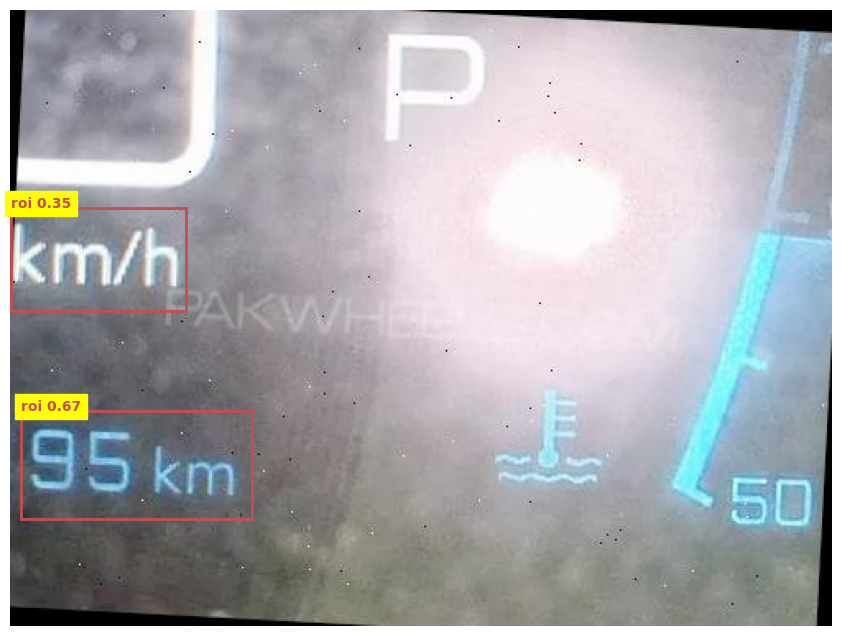

In [8]:
import cv2
import matplotlib.pyplot as plt
import random

folder = '/content/odo_dataset/test/images'
all_files = [os.path.join(folder, f) for f in os.listdir(folder) if os.path.isfile(os.path.join(folder, f))]
selected = random.sample(all_files, 20)

# selected = [
#     '/kaggle/input/carsight-test/test/img1.jpg',
#     '/kaggle/input/carsight-test/test/img2.jpg',
#     '/kaggle/input/carsight-test/test/img3.jpg'
# ]

def plot(img_path, boxes, class_names):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)

    for box in boxes:
        x1, y1, x2, y2, confidence, class_id = box
        ax.add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none'))
        ax.text(x1, y1, f'{class_names[int(class_id)]} {confidence:.2f}', color='r', fontsize=10, weight='bold', backgroundcolor='yellow')

    plt.axis('off')
    plt.show()

model = YOLO('/content/runs/detect/CarSight-Odo/weights/best.pt')
class_names = model.names

for img in selected:
    pred = model.predict(img, save=True, save_txt=True, save_conf=True, project='/content/predictions/')
    boxes = pred[0].boxes.data.cpu().numpy()
    plot(img, boxes, class_names)

In [10]:
shutil.make_archive('/content/CarSight-Odo', 'zip', '/content/runs')

'/content/CarSight-Odo.zip'

In [16]:
import subprocess

try:
    subprocess.check_call(["pip", "install", "easyocr", "opencv-python-headless", "numpy"])
    print("Packages installed successfully!")
except subprocess.CalledProcessError as e:
    print(f"An error occurred during installation: {e}")


Packages installed successfully!



image 1/1 /content/odo_dataset/test/images/image_190_webp.rf.523c49c17850a31edf9b5efe3ab88f41.jpg: 480x640 1 roi, 16.7ms
Speed: 10.0ms preprocess, 16.7ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict26
1 label saved to /content/predictions/predict26/labels


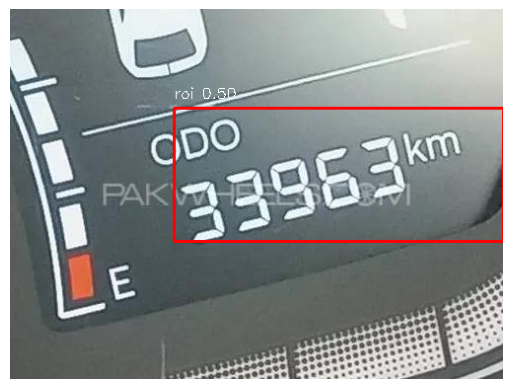

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete========================================
Text Detected: 33963

image 1/1 /content/odo_dataset/test/images/image_30-2-_webp.rf.d539d24a992a1bf26dc987c9c4c662f9.jpg: 480x640 1 roi, 13.1ms
Speed: 1.9ms preprocess, 13.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict27
1 label saved to /content/predictions/predict27/labels


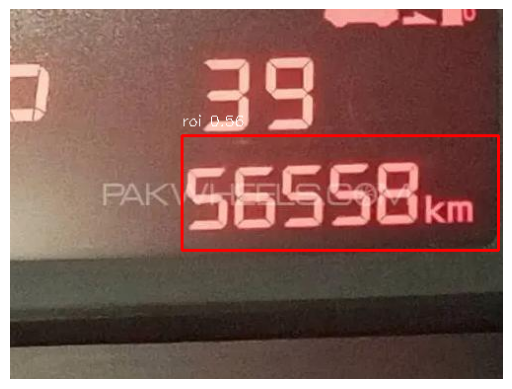

Text Detected: 5658

image 1/1 /content/odo_dataset/test/images/image_86_webp.rf.2939c11c6b28710fa027c20e56eee429.jpg: 480x640 1 roi, 13.2ms
Speed: 2.0ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict28
1 label saved to /content/predictions/predict28/labels


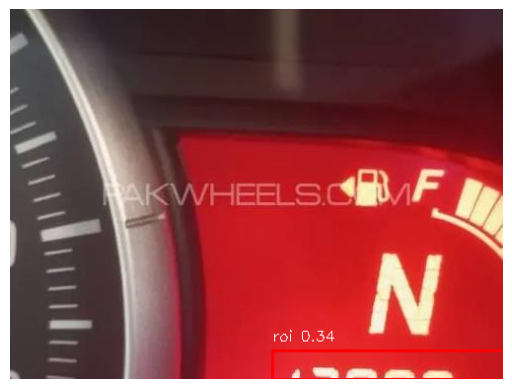

Text Detected: 

image 1/1 /content/odo_dataset/test/images/image_354_webp.rf.d7042186cb1d634d840290f4ca5e6d63.jpg: 480x640 1 roi, 15.7ms
Speed: 2.6ms preprocess, 15.7ms inference, 2.9ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict29
1 label saved to /content/predictions/predict29/labels


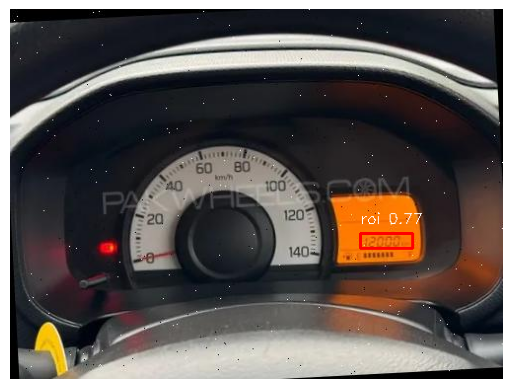

Text Detected: 

image 1/1 /content/odo_dataset/test/images/image_74-3-_webp.rf.f93f6abe8cbdbc90a12a2ab90aaed7cf.jpg: 480x640 1 roi, 16.3ms
Speed: 2.8ms preprocess, 16.3ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict30
1 label saved to /content/predictions/predict30/labels


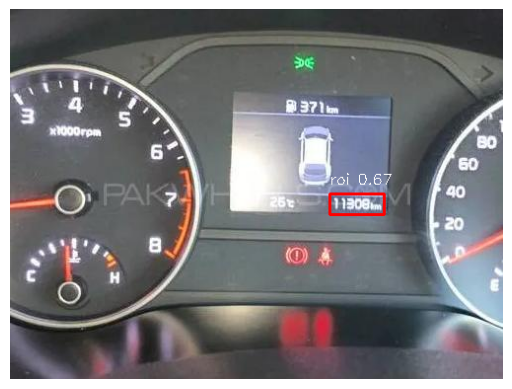

Text Detected: 113081

image 1/1 /content/odo_dataset/test/images/image_6_webp.rf.e5dc9b54df29c0b2835870bc712e3cab.jpg: 480x640 1 roi, 13.2ms
Speed: 3.1ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict31
1 label saved to /content/predictions/predict31/labels


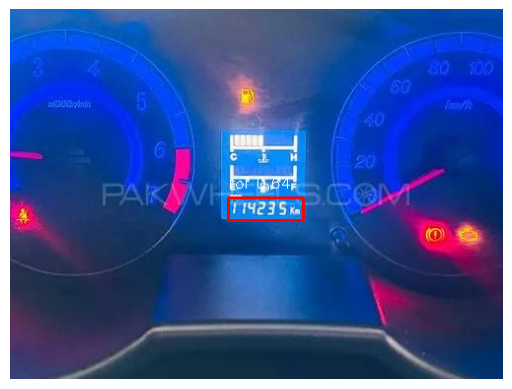

Text Detected: 104235

image 1/1 /content/odo_dataset/test/images/image_5_webp.rf.b0b51934e71514e3f47a5c87cdfe4fd9.jpg: 288x640 1 roi, 11.4ms
Speed: 1.8ms preprocess, 11.4ms inference, 1.5ms postprocess per image at shape (1, 3, 288, 640)
Results saved to /content/predictions/predict32
1 label saved to /content/predictions/predict32/labels


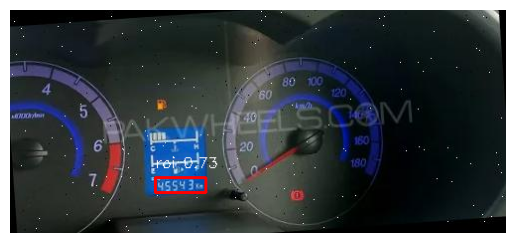

Text Detected: 45543

image 1/1 /content/odo_dataset/test/images/image_4-7-_webp.rf.b2b03630f836f9265362739f43e39200.jpg: 480x640 1 roi, 14.5ms
Speed: 3.0ms preprocess, 14.5ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict33
1 label saved to /content/predictions/predict33/labels


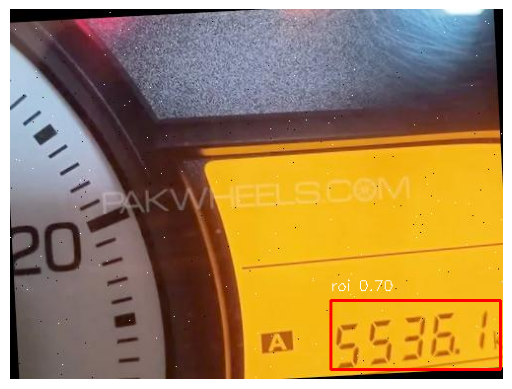

Text Detected: 

image 1/1 /content/odo_dataset/test/images/image_38_webp.rf.a9e2870deb2be361b98cb9a8affdd4d9.jpg: 480x640 1 roi, 16.8ms
Speed: 3.1ms preprocess, 16.8ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict34
1 label saved to /content/predictions/predict34/labels


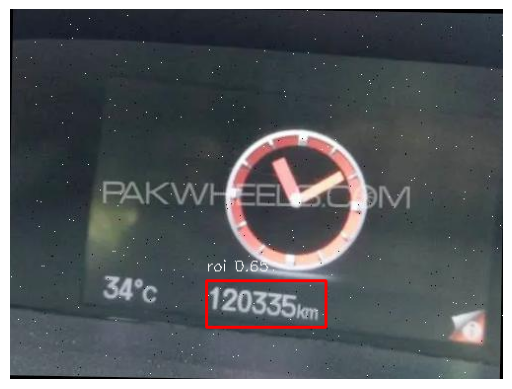

Text Detected: 1120335

image 1/1 /content/odo_dataset/test/images/image_66-4-_webp.rf.fe7ad35d9ad4e7940bdfbffc9f696fda.jpg: 640x480 1 roi, 20.5ms
Speed: 2.7ms preprocess, 20.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /content/predictions/predict35
1 label saved to /content/predictions/predict35/labels


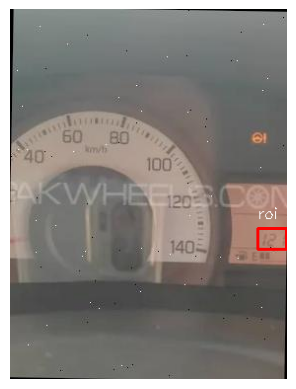

Text Detected: 

image 1/1 /content/odo_dataset/test/images/image_55-2-_webp.rf.9004c06fff02f89baf9e51dff6e318a7.jpg: 640x480 1 roi, 15.2ms
Speed: 2.6ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /content/predictions/predict36
1 label saved to /content/predictions/predict36/labels


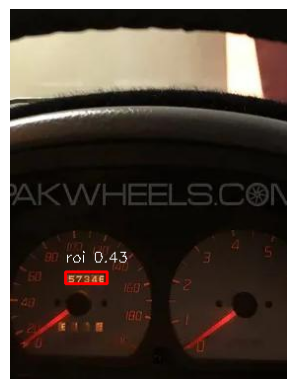

Text Detected: 576

image 1/1 /content/odo_dataset/test/images/image_28-5-_webp.rf.cf6125b921514b35469206fa6abac451.jpg: 512x640 1 roi, 14.2ms
Speed: 3.2ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)
Results saved to /content/predictions/predict37
1 label saved to /content/predictions/predict37/labels


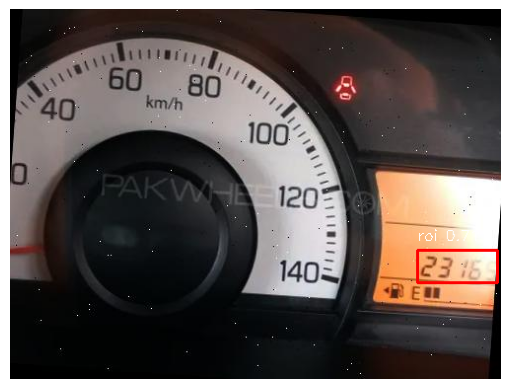

Text Detected: 236

image 1/1 /content/odo_dataset/test/images/image_9-21-_webp.rf.83d072353fd39b58d7a75a8b0c731a3e.jpg: 640x480 1 roi, 13.1ms
Speed: 3.2ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /content/predictions/predict38
1 label saved to /content/predictions/predict38/labels


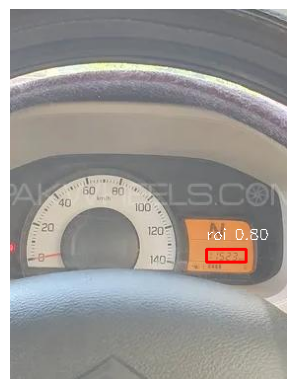

Text Detected: 

image 1/1 /content/odo_dataset/test/images/image_12_webp.rf.bfc1ee22c11b6dc9bac85b6d9b93314d.jpg: 480x640 1 roi, 14.2ms
Speed: 2.7ms preprocess, 14.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict39
1 label saved to /content/predictions/predict39/labels


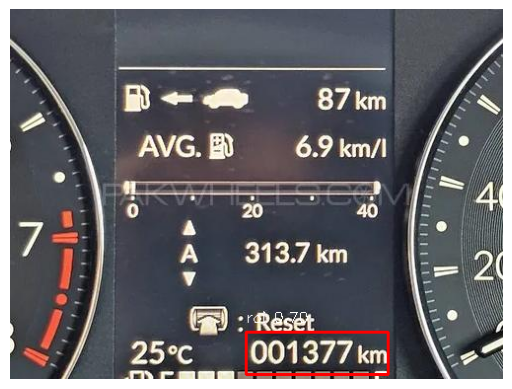

Text Detected: 001377

image 1/1 /content/odo_dataset/test/images/image_16-4-_webp.rf.7cc1713c65e47b9857d9191c61cc54b0.jpg: 480x640 1 roi, 17.3ms
Speed: 2.9ms preprocess, 17.3ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict40
1 label saved to /content/predictions/predict40/labels


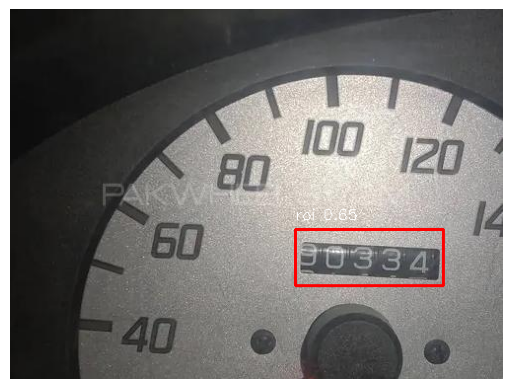

Text Detected: 80334

image 1/1 /content/odo_dataset/test/images/image_79-2-_webp.rf.37d42bfc1d423473bcc24145bf41ee65.jpg: 512x640 1 roi, 18.2ms
Speed: 3.0ms preprocess, 18.2ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 640)
Results saved to /content/predictions/predict41
1 label saved to /content/predictions/predict41/labels


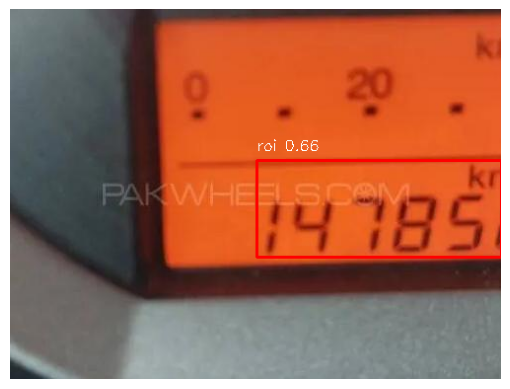

Text Detected: 14785

image 1/1 /content/odo_dataset/test/images/image_167_webp.rf.13d0f2d3fa27dbe2448a52c2dcf4fa37.jpg: 480x640 1 roi, 14.2ms
Speed: 3.0ms preprocess, 14.2ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/predictions/predict42
1 label saved to /content/predictions/predict42/labels


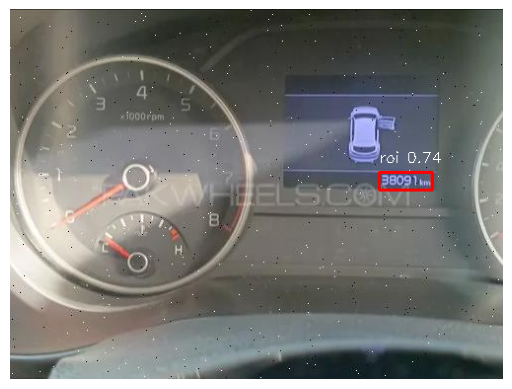

Text Detected: 300914

image 1/1 /content/odo_dataset/test/images/image_4-2-_webp.rf.58ab55db3060a4eb87401420b5efd8ba.jpg: 320x640 (no detections), 16.5ms
Speed: 2.0ms preprocess, 16.5ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 640)
Results saved to /content/predictions/predict43
0 label saved to /content/predictions/predict43/labels


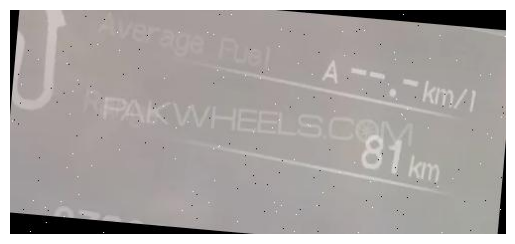

Error: The image must have exactly one bounding box for OCR processing.

image 1/1 /content/odo_dataset/test/images/image_84_webp.rf.46199ac6fd7c466664ad6461c55ee738.jpg: 640x512 1 roi, 18.6ms
Speed: 2.9ms preprocess, 18.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 512)
Results saved to /content/predictions/predict44
1 label saved to /content/predictions/predict44/labels


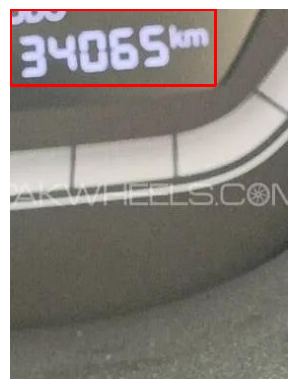

Text Detected: 834065

image 1/1 /content/odo_dataset/test/images/image_90-3-_webp.rf.c8a3a12ef5be6818ec7ac283d0cb30e9.jpg: 640x480 1 roi, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /content/predictions/predict45
1 label saved to /content/predictions/predict45/labels


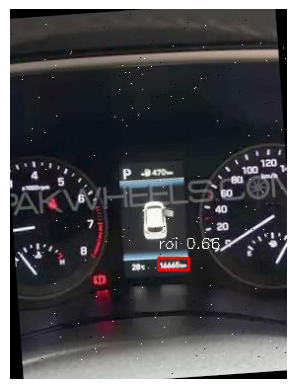

Text Detected: 


In [27]:
import cv2
import easyocr
import re
import os
import random
from matplotlib import pyplot as plt

def plot(image_path, boxes, class_names):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    for box in boxes:
        x_min, y_min, x_max, y_max, confidence, class_id = box
        x_min, y_min, x_max, y_max = map(int, [x_min, y_min, x_max, y_max])
        label = f"{class_names[int(class_id)]} {confidence:.2f}"
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        cv2.putText(image, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

def ocr(image_path, boxes):
    if len(boxes) != 1:
        raise ValueError("The image must have exactly one bounding box for OCR processing.")
    image = cv2.imread(image_path)

    x_min, y_min, x_max, y_max, _, _ = boxes[0]
    x_min, y_min, x_max, y_max = map(int, [x_min, y_min, x_max, y_max])

    cropped_image = image[y_min:y_max, x_min:x_max]
    gray_cropped_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)
    reader = easyocr.Reader(['en'], gpu=True)
    ocr_result = reader.readtext(gray_cropped_image, detail=0)

    detected_text = " ".join(ocr_result)
    numbers_only = re.sub(r'[^0-9]', '', detected_text)

    return numbers_only

folder = '/content/odo_dataset/test/images'
all_files = [os.path.join(folder, f) for f in os.listdir(folder) if os.path.isfile(os.path.join(folder, f))]
selected = random.sample(all_files, 20)  # Randomly select 20 images

# Load YOLO model
model = YOLO('/content/runs/detect/CarSight-Odo/weights/best.pt')
class_names = model.names

# Process each selected image
for img in selected:
    # Make predictions
    pred = model.predict(img, save=True, save_txt=True, save_conf=True, project='/content/predictions/')

    # Extract bounding boxes
    boxes = pred[0].boxes.data.cpu().numpy()

    try:
        plot(img, boxes, class_names)
        detected_text = ocr(img, boxes)
        print('=' * 40)
        print('Text Detected:', detected_text)
    except ValueError as e:
        print('=' * 40)
        print(f"Error: {e}")
    except FileNotFoundError as e:
        print('=' * 40)
        print(f"Error: {e}")

In [28]:
model.save('/content/CarSight_Odometer_Model.pt')